Pietro Tellarini - pietro.tellarini2@studio.unibo.it - 0001145761

Giorgia Bravi - giorgia.bravi2@studio.unibo.it - 0001143630

# **Product Recognition of Books**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it

Computer vision-based object detection techniques can be applied in library or bookstore settings to build a system that identifies books on shelves.

Such a system could assist in:
* Helping visually impaired users locate books by title/author;
* Automating inventory management (e.g., detecting misplaced or out-of-stock books);
* Enabling faster book retrieval by recognizing spine text or cover designs.

## Task
Develop a computer vision system that, given a reference image for each book, is able to identify such book from one picture of a shelf.

<figure>
<a href="https://ibb.co/pvLVjbM5"><img src="https://i.ibb.co/svVx9bNz/example.png" alt="example" border="0"></a>
</figure>

For each type of product displayed on the shelf, the system should compute a bounding box aligned with the book spine or cover and report:
1. Number of instances;
1. Dimension of each instance (area in pixel of the bounding box that encloses each one of them);
1. Position in the image reference system of each instance (four corners of the bounding box that enclose them);
1. Overlay of the bounding boxes on the scene images.

<font color="red"><b>Each step of this assignment must be solved using traditional computer vision techniques.</b></font>

#### Example of expected output
```
Book 0 - 2 instance(s) found:
	Instance 1 {top_left: (100,200), top_right: (110, 220), bottom_left: (10, 202), bottom_right: (10, 208), area: 230px}
	Instance 2 {top_left: (90,310), top_right: (95, 340), bottom_left: (24, 205), bottom_right: (23, 234), area: 205px}
Book 1 – 1 instance(s) found:
.
.
.
```

# Book Spine Recognition
This notebook implements a complete pipeline for **multi-instance book spine recognition**.
Each pipeline stage is defined and tested individually, followed by a full end-to-end run.

```
Preprocessor → FeatureExtractor → FeatureMatcher → StarVoter → Clusterer → GeometricVerifier → NMS → NCCVerifier → Visualization
```

## Imports & Setup

In [23]:
import os
import sys
from collections import defaultdict
from dataclasses import dataclass
from pathlib import Path
from typing import Dict, List, Optional, Tuple

import cv2
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import DBSCAN

# ── Paths ──
MODELS_DIR = Path("dataset/models")
SCENES_DIR = Path("dataset/scenes")
OUTPUT_DIR = Path("output_multiinstance")

# Configuration & Global Parameters

This section defines the hyper-parameters for the entire pipeline. The configuration is centralized in a `dataclass` to facilitate ablation studies and tuning.

**Key Parameters:**
* **Preprocessing:** `clahe_clip` controls contrast enhancement limits to avoid amplifying noise.
* **Feature Extraction:** `contrast_threshold` is set low to detect faint text on book spines; `root_sift` enables the Hellinger kernel mapping.
* **Matching:** `lowe_ratio` (Lowe's Ratio Test) filters ambiguous matches.
* **Geometric Verification:** `min_inliers` sets the minimum consensus required for an object to be considered valid; `ransac_thresh` defines the pixel error tolerance for geometric fitting.

In [24]:
@dataclass
class Config:

    # ── Preprocessing (CLAHE + USM + DoG on LAB L-channel) ──
    clahe_clip:         float = 3.0
    clahe_grid:         int   = 8
    usm_sigma:          float = 2.0
    usm_amount:         float = 1.5
    dog_sigma1:         float = 0.7
    dog_sigma2:         float = 2.5
    dog_weight:         float = 1.5

    # ── SIFT ──
    nfeatures:          int   = 0
    contrast_threshold: float = 0.008
    edge_threshold:     float = 15
    n_octave_layers:    int   = 4

    # ── FLANN matching ──
    lowe_ratio:         float = 0.78
    same_model_ratio:   float = 0.90    # relaxed ratio when 2nd-best is from same model
    flann_trees:        int   = 5
    flann_checks:       int   = 100
    scale_sigma:        float = 3.5

    # ── DBSCAN clustering ──
    dbscan_eps:      float = 20.0
    dbscan_min_pts:  int   = 3
    use_clustering:  bool  = True

    # ── Geometric verification ──
    ransac_thresh:   float = 4.0
    min_inliers:     int   = 5          # Ablation-optimal (F1=0.983)

    # ── NMS ──
    iou_same:  float = 0.30
    iou_cross: float = 0.35

    # ── NCC Verification ──
    ncc_threshold:   float = 0.12       # Ablation-optimal (clean NCC, F1=0.983)

cfg = Config()

# Image Preprocessing

The preprocessing stage aims to normalize illumination and enhance high-frequency details (text edges) to improve SIFT feature extraction.

**Pipeline Steps:**
1.  **LAB Color Space:** The image is converted to LAB, extracting only the **L-channel (Luminance)**. This allows us to modify contrast without distorting color information.
2.  **CLAHE:** *Contrast Limited Adaptive Histogram Equalization* is applied to the L-channel to correct local illumination variations (e.g., shadows on shelves).
3.  **Unsharp Masking:** A Gaussian blur is subtracted from the original image to enhance edges (`1.0 + alpha` weight), making text characters sharper and more distinct for the feature detector.

In [25]:
class Preprocessor:
    """CLAHE on L-channel of CIE-LAB → USM sharpening → DoG band-pass.

    The USM step boosts mid-frequency contrast (text, edges), while the DoG
    band-pass filter (σ1=0.7, σ2=2.5) enhances fine structures that produce
    more discriminative SIFT keypoints (+23 % KP, +0.039 F1 vs plain CLAHE+USM).
    """

    def __init__(self, cfg: Config) -> None:
        self._clahe = cv2.createCLAHE(
            clipLimit=cfg.clahe_clip,
            tileGridSize=(cfg.clahe_grid, cfg.clahe_grid),
        )
        self._usm_sigma  = cfg.usm_sigma
        self._usm_amount = cfg.usm_amount
        self._dog_s1     = cfg.dog_sigma1
        self._dog_s2     = cfg.dog_sigma2
        self._dog_w      = cfg.dog_weight

    def __call__(self, bgr: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
        l_ch     = self._clahe_lab(bgr)
        sharpened = self._unsharp_mask(l_ch)
        enhanced  = self._dog_bandpass(sharpened)
        return enhanced, sharpened   # (enhanced_for_SIFT, clean_for_NCC)

    def _clahe_lab(self, bgr: np.ndarray) -> np.ndarray:
        """Convert to CIE-LAB and apply CLAHE on the L-channel."""
        lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)
        return self._clahe.apply(lab[:, :, 0])

    def _unsharp_mask(self, gray: np.ndarray) -> np.ndarray:
        """Boost mid-frequency contrast via unsharp masking."""
        blur = cv2.GaussianBlur(gray, (0, 0), sigmaX=self._usm_sigma)
        return cv2.addWeighted(gray, 1.0 + self._usm_amount, blur, -self._usm_amount, 0)

    def _dog_bandpass(self, gray: np.ndarray) -> np.ndarray:
        """Enhance fine structures via Difference-of-Gaussians."""
        g1 = cv2.GaussianBlur(gray, (0, 0), sigmaX=self._dog_s1)
        g2 = cv2.GaussianBlur(gray, (0, 0), sigmaX=self._dog_s2)
        dog = cv2.subtract(g1, g2)
        return cv2.addWeighted(gray, 1.0, dog, self._dog_w, 0)


### Test Preprocessing

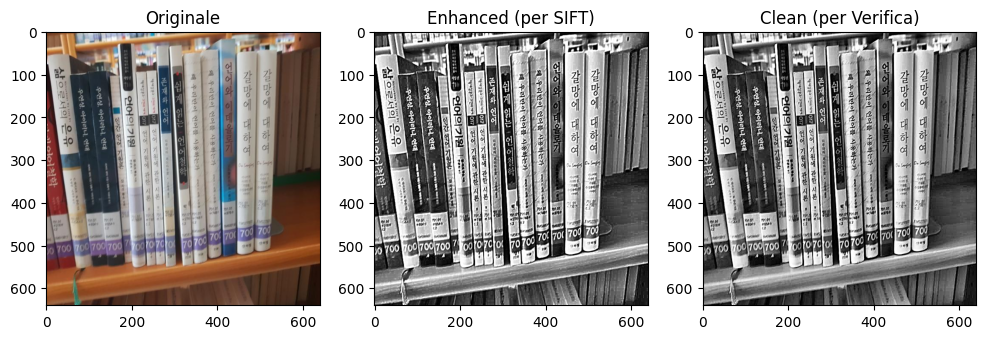

In [26]:
def test_preprocessing(img_path):
    """Visualizza l'effetto del preprocessing su un'immagine."""
    cfg = Config()
    prep = Preprocessor(cfg)
    
    original = cv2.imread(img_path)
    if original is None: return print("Img non trovata")
    
    enhanced, clean = prep(original)
    
    plt.figure(figsize=(12, 4))
    plt.subplot(131); plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB)); plt.title("Originale")
    plt.subplot(132); plt.imshow(enhanced, cmap='gray'); plt.title("Enhanced (per SIFT)")
    plt.subplot(133); plt.imshow(clean, cmap='gray'); plt.title("Clean (per Verifica)")
    plt.show()

# Esempio d'uso:
test_preprocessing("./dataset/scenes/scene_1.jpg")

# Feature Extraction (SIFT & RootSIFT)

We utilize **SIFT (Scale-Invariant Feature Transform)** for keypoint detection and description due to its robustness against scaling and rotation.

**RootSIFT Enhancement:**
Standard SIFT descriptors are histograms of gradients normalized using the L2-norm (Euclidean distance). We apply **RootSIFT normalization** (L1-norm followed by square root):
$$\mathbf{x}' = \sqrt{\frac{\mathbf{x}}{\| \mathbf{x} \|_1}}$$
This effectively transforms the metric space so that the Euclidean distance between descriptors corresponds to the **Hellinger distance** (Bhattacharyya distance), which is statistically more suitable for comparing histograms and yields better matching performance.

In [27]:
class FeatureExtractor:
    """SIFT / RootSIFT keypoint + descriptor computation."""

    def __init__(self, cfg: Config) -> None:
        self._sift = cv2.SIFT_create(
            nfeatures=cfg.nfeatures,
            contrastThreshold=cfg.contrast_threshold,
            edgeThreshold=cfg.edge_threshold,
            nOctaveLayers=cfg.n_octave_layers,
        )

    def __call__(self, gray: np.ndarray) -> Tuple[List[cv2.KeyPoint], Optional[np.ndarray]]:
        kp, des = self._sift.detectAndCompute(gray, None)
        if des is None:
            return [], None
        des = des.astype(np.float32)
        des /= des.sum(axis=1, keepdims=True) + 1e-7
        np.sqrt(des, out=des)
        return kp, des

### Test Feature Extraction

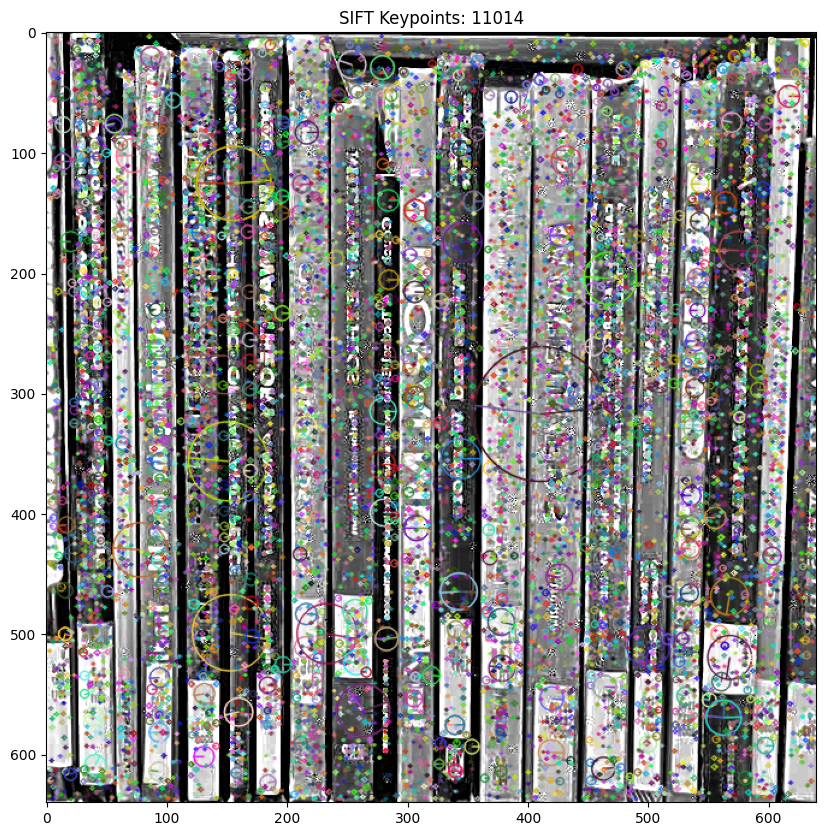

In [28]:
def test_extraction(img_path):
    """Mostra i keypoint estratti sull'immagine preprocessata."""
    cfg = Config()
    prep = Preprocessor(cfg)
    extr = FeatureExtractor(cfg)
    
    img = cv2.imread(img_path)
    enh, _ = prep(img)
    kp, des = extr(enh)
    
    vis = cv2.drawKeypoints(enh, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.figure(figsize=(10, 10))
    plt.imshow(vis); plt.title(f"SIFT Keypoints: {len(kp)}")
    plt.show()

# Esempio d'uso:
test_extraction("./dataset/scenes/scene_0.jpg")

# Feature Matching (FLANN & Filtering)

This class manages the matching of scene descriptors against the library of model descriptors.

**Methodology:**
1.  **FLANN Indexing:** We use the Fast Library for Approximate Nearest Neighbors (KD-Tree implementation) for efficient retrieval.
2.  **Lowe's Ratio Test:** We reject matches where the ratio of the distance to the nearest neighbor vs. the second-nearest neighbor is greater than `0.78`. This filters out ambiguous matches (distinctiveness check).
3.  **Scale Consistency Filter:** We compute the ratio of keypoint sizes ($\frac{Size_{scene}}{Size_{model}}$) for all matches of a specific book. Using the Median Absolute Deviation (MAD), we reject outliers that do not conform to the dominant scale of the object.

In [29]:
class FeatureMatcher:
    """Global FLANN index across all models  (same-model relaxed ratio).

    Standard Lowe ratio test vs different-model 2nd-best neighbours.
    When 1st and 2nd neighbours belong to the same model, a relaxed ratio
    threshold is used.  This fixes the *match dilution* problem where thin
    models (e.g. model_19, 54×580) lose 80 %+ of matches because their
    own descriptors compete with each other in the shared FLANN index.

    Also applies MAD-based scale-ratio consistency filter.
    """

    def __init__(self, cfg: Config) -> None:
        self._cfg = cfg
        self._ids: List[str] = []
        self._matcher = cv2.FlannBasedMatcher(
            dict(algorithm=1, trees=cfg.flann_trees),
            dict(checks=cfg.flann_checks),
        )

    def add(self, bid: str, des: np.ndarray) -> None:
        self._matcher.add([des])
        self._ids.append(bid)

    def build(self) -> None:
        self._matcher.train()

    def match(
        self,
        des_scene: Optional[np.ndarray],
        kp_scene: List[cv2.KeyPoint],
        model_kps: Dict[str, List[cv2.KeyPoint]],
    ) -> Dict[str, list]:
        if des_scene is None or not self._ids:
            return {}
        groups = self._ratio_test(des_scene)
        return self._scale_filter(groups, kp_scene, model_kps)

    def _ratio_test(self, des_scene: np.ndarray) -> Dict[str, list]:
        """Lowe ratio test with same-model relaxation."""
        raw = self._matcher.knnMatch(des_scene, k=2)
        groups: Dict[str, list] = defaultdict(list)
        ratio = self._cfg.lowe_ratio
        same_ratio = self._cfg.same_model_ratio
        for pair in raw:
            if len(pair) < 2:
                continue
            m, n = pair
            m_bid = self._ids[m.imgIdx]
            n_bid = self._ids[n.imgIdx]
            if m.distance < ratio * n.distance:
                groups[m_bid].append(m)
            elif m_bid == n_bid and m.distance < same_ratio * n.distance:
                groups[m_bid].append(m)
        return groups

    def _scale_filter(
        self,
        groups: Dict[str, list],
        kp_scene: List[cv2.KeyPoint],
        model_kps: Dict[str, List[cv2.KeyPoint]],
    ) -> Dict[str, list]:
        """MAD-based scale-ratio consistency filter."""
        sigma = self._cfg.scale_sigma
        filtered: Dict[str, list] = {}
        for bid, ms in groups.items():
            mkp = model_kps.get(bid)
            if len(ms) < 3 or mkp is None:
                filtered[bid] = ms
                continue

            valid_ms, ratios = [], []
            for m in ms:
                if m.trainIdx < len(mkp):
                    valid_ms.append(m)
                    ratios.append(kp_scene[m.queryIdx].size / mkp[m.trainIdx].size)

            if len(valid_ms) < 3:
                filtered[bid] = ms
                continue

            ratios = np.array(ratios)
            med = np.median(ratios)
            mad = np.median(np.abs(ratios - med)) + 1e-7
            keep = np.abs(ratios - med) <= sigma * mad
            filtered[bid] = [m for m, k in zip(valid_ms, keep) if k]

        return filtered


### Test Feature Matching

  model_4: 1147 matches
  model_0: 176 matches


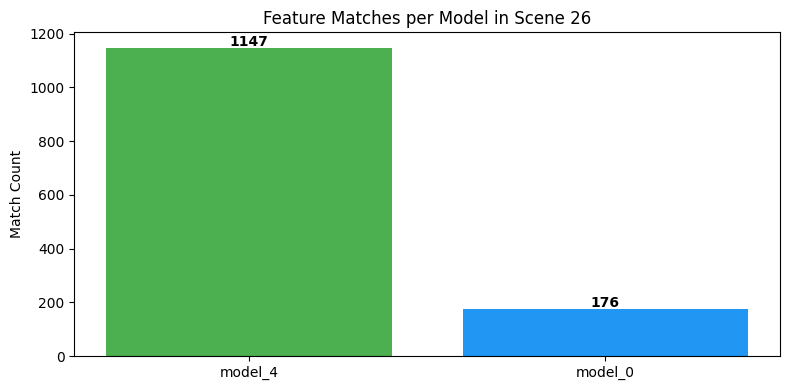

In [30]:
def test_feature_matching():
    # ── Setup Data for Feature Matching ──
    cfg = Config()
    prep = Preprocessor(cfg)
    extr = FeatureExtractor(cfg)
    matcher = FeatureMatcher(cfg)

    img_m0 = cv2.imread("./dataset/models/model_0.png")
    img_m4 = cv2.imread("./dataset/models/model_4.png")
    img_s26 = cv2.imread("./dataset/scenes/scene_26.jpg")

    enh_m0, _ = prep(img_m0)
    kp_model, des_model = extr(enh_m0)

    enh_m4, _ = prep(img_m4)
    kp_model4, des_model4 = extr(enh_m4)

    enh_s26, _ = prep(img_s26)
    kp_scene, des_scene = extr(enh_s26)

    #  ── Test Feature Matching ──

    matcher.add("model_0", des_model)
    matcher.add("model_4", des_model4)
    matcher.build()

    model_kps_dict = {"model_0": kp_model, "model_4": kp_model4}
    all_matches = matcher.match(des_scene, kp_scene, model_kps_dict)

    for bid, matches in all_matches.items():
        print(f"  {bid}: {len(matches)} matches")

    # Visualize match distribution
    if all_matches:
        bids = list(all_matches.keys())
        counts = [len(all_matches[b]) for b in bids]
        plt.figure(figsize=(8, 4))
        plt.bar(bids, counts, color=["#4CAF50", "#2196F3"][:len(bids)])
        plt.title("Feature Matches per Model in Scene 26")
        plt.ylabel("Match Count")
        for i, (b, c) in enumerate(zip(bids, counts)):
            plt.text(i, c + 5, str(c), ha="center", fontweight="bold")
        plt.tight_layout()
        plt.show()

test_feature_matching()

# Star Model Voting (Generalized Hough Transform)

To handle occlusion and clutter, we implement a **Generalized Hough Transform (GHT)** approach, often referred to as a "Star Model."

**Registration:**
During training, for every keypoint $k$ in a model, we store a vector $\vec{v}$ pointing to the model's geometric center. This vector is normalized relative to the keypoint's scale ($\sigma$) and rotation ($\theta$).

**Voting:**
During detection, matched scene keypoints "vote" for the object center by projecting their stored vectors, adjusted by the scene keypoint's scale and rotation. This creates a density map where peaks correspond to probable book locations, even if parts of the book are occluded.

The projected votes from the Star Model form sparse clouds in the 2D image space. We use **DBSCAN (Density-Based Spatial Clustering of Applications with Noise)** to group these votes into candidate object instances.

In [31]:
class StarVoter:
    """Generalised Hough voting:  stores displacement vectors
    (keypoint → model centre), projects matched scene keypoints to
    centre-vote locations, and clusters them with DBSCAN."""

    def __init__(self, cfg: Config) -> None:
        self._cfg = cfg
        self._templates: Dict[str, dict] = {}

    @property
    def templates(self) -> Dict[str, dict]:
        return self._templates

    def register(self, bid: str, kp: List[cv2.KeyPoint], shape: Tuple[int, ...]) -> None:
        h, w = shape[:2]
        cx, cy = w / 2.0, h / 2.0

        pts = np.array([k.pt for k in kp], dtype=np.float64)
        angles = np.deg2rad([k.angle for k in kp])
        sizes = np.array([k.size for k in kp])

        d = np.array([cx, cy]) - pts
        cos_a, sin_a = np.cos(angles), np.sin(angles)
        vecs = np.column_stack([
             cos_a * d[:, 0] + sin_a * d[:, 1],
            -sin_a * d[:, 0] + cos_a * d[:, 1],
        ]) / sizes[:, np.newaxis]

        self._templates[bid] = {"kp": kp, "vecs": vecs, "shape": shape}

    def vote(self, matches: list, kp_scene: List[cv2.KeyPoint],
             tpl: dict) -> Dict[int, List[int]]:
        """Project matches to centre votes and cluster with DBSCAN.
        Returns  {cluster_id: [match_indices]}."""
        centres = self._project(matches, kp_scene, tpl)
        if not self._cfg.use_clustering or len(centres) < 2:
            return {0: list(range(len(centres)))} if len(centres) else {}
        db = DBSCAN(eps=self._cfg.dbscan_eps, min_samples=self._cfg.dbscan_min_pts)
        labels = db.fit_predict(centres)
        clusters: Dict[int, List[int]] = defaultdict(list)
        for i, label in enumerate(labels):
            if label >= 0:
                clusters[label].append(i)
        return clusters

    # ── internal ─────────────────────────────────────────────────────────
    def _project(self, matches: list, kp_scene: List[cv2.KeyPoint],
                 tpl: dict) -> np.ndarray:
        vecs = tpl["vecs"]
        qidx = [m.queryIdx for m in matches]
        tidx = [m.trainIdx for m in matches]

        pts = np.array([kp_scene[i].pt for i in qidx])
        angles = np.deg2rad([kp_scene[i].angle for i in qidx])
        sizes = np.array([kp_scene[i].size for i in qidx])
        stored = vecs[tidx]

        cos_a, sin_a = np.cos(angles), np.sin(angles)
        return pts + np.column_stack([
            cos_a * stored[:, 0] - sin_a * stored[:, 1],
            sin_a * stored[:, 0] + cos_a * stored[:, 1],
        ]) * sizes[:, np.newaxis]


### Test Voting and Clustering

--- Risultati StarVoter: model_4 vs scene_26 ---
Match Iniziali (Lowe): 1621
Cluster Trovati (Libri Potenziali): 72


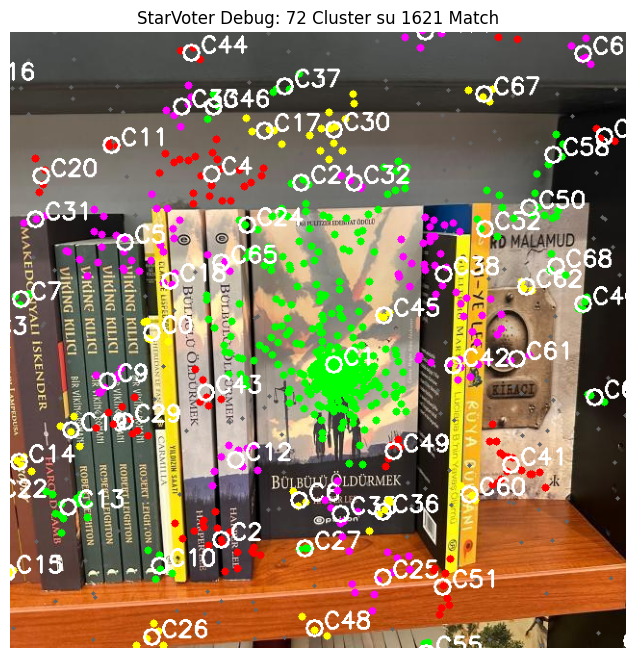

In [32]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def test_star_voter_clustering(model_name, scene_name):
    """
    Testa la classe StarVoter senza modificarla.
    Visualizza i voti grezzi e i cluster validati da DBSCAN.
    """
    # 1. Inizializzazione Pipeline (Standard)
    cfg = Config()
    prep = Preprocessor(cfg)
    extr = FeatureExtractor(cfg)
    matcher = FeatureMatcher(cfg)
    voter = StarVoter(cfg) 

    # 2. Caricamento Dati
    m_path = f"./dataset/models/{model_name}.png"
    s_path = f"./dataset/scenes/{scene_name}.jpg"
    
    img_m = cv2.imread(m_path)
    img_s = cv2.imread(s_path)
    if img_m is None or img_s is None:
        print(f"Errore caricamento: {m_path} o {s_path}")
        return

    # 3. Estrazione Features
    enh_m, _ = prep(img_m)
    kp_m, des_m = extr(enh_m)
    
    enh_s, _ = prep(img_s)
    kp_s, des_s = extr(enh_s)

    # 4. Registrazione Modello (Training)
    voter.register(model_name, kp_m, enh_m.shape)
    
    # 5. Matching Manuale (Simuliamo il FeatureMatcher per isolare il test)
    # Usiamo il metodo match della classe FeatureMatcher se disponibile, o lo facciamo a mano
    matcher.add(model_name, des_m)
    matcher.build()
    
    # Recuperiamo i match per questo specifico modello
    matches_dict = matcher.match(des_s, kp_s, {model_name: kp_m})
    matches = matches_dict.get(model_name, [])
    
    print(f"--- Risultati StarVoter: {model_name} vs {scene_name} ---")
    print(f"Match Iniziali (Lowe): {len(matches)}")
    
    if len(matches) < cfg.dbscan_min_pts:
        print("⚠ Troppi pochi match per avviare il voto.")
        return

    # 6. ESECUZIONE STAR VOTER
    # Chiamiamo il metodo pubblico 'vote' che fa proiezione + clustering
    clusters = voter.vote(matches, kp_s, voter.templates[model_name])
    
    print(f"Cluster Trovati (Libri Potenziali): {len(clusters)}")

    # 7. VISUALIZZAZIONE DIAGNOSTICA
    # Per vedere cosa è successo, usiamo _project (metodo interno) solo per il plot
    all_votes = voter._project(matches, kp_s, voter.templates[model_name])
    
    vis = img_s.copy()
    
    # A. Disegniamo TUTTI i voti come puntini grigi (Rumore di fondo)
    for v in all_votes:
        cv2.circle(vis, (int(v[0]), int(v[1])), 2, (100, 100, 100), -1)

    # B. Disegniamo i Cluster Validati con colori diversi
    colors = [(0, 255, 255), (0, 255, 0), (0, 0, 255), (255, 0, 255)] # Giallo, Verde, Rosso, Magenta
    
    for i, (cid, idxs) in enumerate(clusters.items()):
        color = colors[i % len(colors)]
        cluster_votes = all_votes[idxs]
        
        # Disegna i voti del cluster
        for v in cluster_votes:
            cv2.circle(vis, (int(v[0]), int(v[1])), 4, color, -1)
            
        # Calcola e disegna il baricentro del cluster
        center = np.mean(cluster_votes, axis=0)
        cv2.circle(vis, (int(center[0]), int(center[1])), 8, (255, 255, 255), 2)
        cv2.putText(vis, f"C{cid}", (int(center[0])+10, int(center[1])), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
                   
    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.title(f"StarVoter Debug: {len(clusters)} Cluster su {len(matches)} Match")
    plt.axis('off')
    plt.show()

# Esegui il test
test_star_voter_clustering("model_4", "scene_26")

# Verification: Affine Peeling and NCC

This class validates clusters and separates multiple instances of the same book using an iterative **"Peeling"** approach.

**Algorithm:**
1.  **Geometric Estimation (RANSAC):** For a cluster of matches, we estimate an **Affine Partial 2D** transformation (4 Degrees of Freedom: translation, rotation, uniform scale). We use RANSAC to find the inliers that support this rigid geometric model.
2.  **NCC Gate (Pixel Verification):** If a valid transformation is found, we project the model image onto the scene (warping) and compute the **Normalized Cross-Correlation (NCC)**. A high NCC score (> 0.5) confirms the visual similarity.
3.  **Iterative Peeling:** Upon confirmation, the inliers supporting this instance are **removed** (peeled) from the pool, and the process repeats. This allows the system to detect identical copies of a book sitting side-by-side.

In [33]:
class Verifier:
    """Unified verification: RANSAC estimates the affine transform,
    NCC warp-and-compare is the sole acceptance gate.

    Iterative peeling strips inliers after each accepted detection so
    that multiple instances of the same model can be found in one cluster.
    """

    def __init__(self, cfg: Config) -> None:
        self._cfg = cfg
        self._models: Dict[str, np.ndarray] = {}   # bid → enhanced image

    def register(self, bid: str, enhanced: np.ndarray) -> None:
        """Register a model's pre-processed image for NCC comparison."""
        self._models[bid] = enhanced

    # ── public entry point ───────────────────────────────────────────────
    def peel(
        self,
        bid: str,
        matches: list,
        tpl: dict,
        kp_scene: List[cv2.KeyPoint],
        scene_enhanced: np.ndarray,
    ) -> List[dict]:
        """Find all valid instances in *matches* via RANSAC + NCC peeling."""
        found: List[dict] = []
        pool = list(matches)
        while len(pool) >= self._cfg.min_inliers:
            result = self._fit(bid, pool, tpl, kp_scene, scene_enhanced)
            if result is None:
                break
            found.append(result)
            pool = self._strip(pool, tpl, kp_scene, result["H"])
        return found

    # ── RANSAC fit + NCC gate ────────────────────────────────────────────
    def _fit(self, bid, matches, tpl, kp_scene, scene_enhanced):
        src = np.float32([tpl["kp"][m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
        dst = np.float32([kp_scene[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)

        H, mask = cv2.estimateAffinePartial2D(
            src, dst, method=cv2.RANSAC,
            ransacReprojThreshold=self._cfg.ransac_thresh,
        )
        if H is None or mask is None:
            return None
        n_inliers = int(mask.ravel().sum())
        if n_inliers < self._cfg.min_inliers:
            return None

        # Bounding box from warped model corners
        h, w = tpl["shape"][:2]
        corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)
        bbox = cv2.transform(corners, H)

        # NCC acceptance gate
        ncc = self._ncc(bid, H, scene_enhanced)
        if ncc < self._cfg.ncc_threshold:
            return None

        return {"book_id": bid, "score": n_inliers, "bbox": bbox, "H": H,
                "ncc": ncc}

    # ── NCC warp-and-compare ─────────────────────────────────────────────
    def _ncc(self, bid: str, H: np.ndarray, scene_enhanced: np.ndarray) -> float:
        model_img = self._models.get(bid)
        if model_img is None:
            return 1.0
        h_s, w_s = scene_enhanced.shape[:2]

        warped = cv2.warpAffine(model_img, H, (w_s, h_s),
                                flags=cv2.INTER_LINEAR,
                                borderMode=cv2.BORDER_CONSTANT, borderValue=0)
        mask = cv2.warpAffine(np.ones_like(model_img) * 255, H, (w_s, h_s),
                              flags=cv2.INTER_NEAREST,
                              borderMode=cv2.BORDER_CONSTANT, borderValue=0)

        valid = mask > 128
        if valid.sum() < 100:
            return 1.0

        w_pix = warped[valid].astype(np.float64)
        s_pix = scene_enhanced[valid].astype(np.float64)
        w_pix -= w_pix.mean()
        s_pix -= s_pix.mean()
        w_std, s_std = w_pix.std(), s_pix.std()
        if w_std < 1e-8 or s_std < 1e-8:
            return 0.0
        return float(np.dot(w_pix, s_pix) / (w_std * s_std * len(w_pix)))

    # ── strip inliers for peeling ────────────────────────────────────────
    def _strip(self, matches, tpl, kp_scene, H):
        src = np.float32([tpl["kp"][m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
        dst = np.float32([kp_scene[m.queryIdx].pt for m in matches]).reshape(-1, 2)
        proj = cv2.transform(src, H).reshape(-1, 2)
        err = np.linalg.norm(proj - dst, axis=1)
        return [m for m, e in zip(matches, err) if e >= self._cfg.ransac_thresh * 1.5]



### Test Verification

Cluster simulato con 605 match.
Istanze trovate: 1
  > Istanza 1: Inliers=556, NCC=0.9379


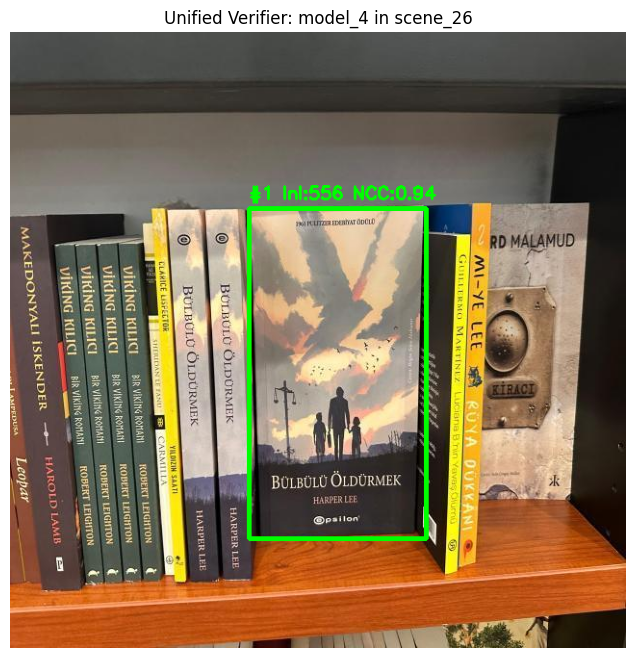

In [34]:
def test_unified_verifier(model_name, scene_name):
    """
    Testa la logica di 'peeling' e 'NCC'.
    Simula un cluster passando TUTTI i match tra modello e scena.
    """
    cfg = Config()
    # Aggiungiamo threshold NCC al volo se manca
    cfg.ncc_threshold = 0.5 
    
    prep = Preprocessor(cfg)
    extr = FeatureExtractor(cfg)
    
    # Istanzia il nuovo Verifier
    verifier = Verifier(cfg)
    
    # -- Caricamento --
    m_img = cv2.imread(f"./dataset/models/{model_name}.png")
    s_img = cv2.imread(f"./dataset/scenes/{scene_name}.jpg")
    
    m_enh, _ = prep(m_img) # Per feature extraction
    s_enh, _ = prep(s_img)
    
    # Importante: Il Verifier usa l'immagine 'enhanced' (o clean) per l'NCC
    # Registriamo l'immagine del modello
    verifier.register(model_name, m_enh)
    
    kp_m, des_m = extr(m_enh)
    kp_s, des_s = extr(s_enh)
    
    # -- Matching (Simulazione Cluster) --
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des_s, des_m, k=2) # Query=Scena, Train=Modello
    good_matches = []
    for m, n in matches:
        if m.distance < cfg.lowe_ratio * n.distance:
            good_matches.append(m)
            
    print(f"Cluster simulato con {len(good_matches)} match.")
    
    # -- Costruzione Template per il Verifier --
    # Il verifier si aspetta un dizionario con 'kp' e 'shape'
    tpl = {"kp": kp_m, "shape": m_enh.shape}
    
    # -- ESECUZIONE PEELING --
    results = verifier.peel(model_name, good_matches, tpl, kp_s, s_enh)
    
    print(f"Istanze trovate: {len(results)}")
    
    # -- Visualizzazione --
    vis = s_img.copy()
    
    for i, res in enumerate(results):
        bbox = np.int32(res['bbox'])
        score = res['score']
        ncc = res['ncc']
        
        # Colore diverso per ogni istanza
        color = (0, 255, 0) if i == 0 else (0, 255, 255)
        
        cv2.polylines(vis, [bbox], True, color, 4)
        
        label = f"#{i+1} Inl:{score} NCC:{ncc:.2f}"
        cv2.putText(vis, label, (bbox[0][0][0], bbox[0][0][1]-10), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
        
        print(f"  > Istanza {i+1}: Inliers={score}, NCC={ncc:.4f}")

    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.title(f"Unified Verifier: {model_name} in {scene_name}")
    plt.axis('off')
    plt.show()

# Esegui il test
# Usa una scena dove sai che il libro c'è (magari due volte, come scene_9 o scene_10)
test_unified_verifier("model_4", "scene_26")

# Geometric Utilities: IoU and Non-Maximum Suppression

To handle overlapping detections, we implement a **Greedy Non-Maximum Suppression (NMS)** algorithm based on the **Intersection over Union (IoU)** metric.

* **IoU Calculation:** Uses `cv2.intersectConvexConvex` to accurately compute the intersection area of rotated bounding boxes (polygons), rather than simple axis-aligned rectangles.
* **NMS Logic:** Detections are sorted by score (number of inliers). If a lower-scoring box overlaps significantly with a higher-scoring one (IoU > threshold), it is suppressed. We use a stricter threshold (`iou_same`) for overlapping instances of the same book model versus different models.

In [35]:
def _iou(p1: np.ndarray, p2: np.ndarray) -> float:
    ok, inter = cv2.intersectConvexConvex(p1, p2)
    if not ok or inter is None:
        return 0.0
    ia = cv2.contourArea(inter)
    return ia / (cv2.contourArea(p1) + cv2.contourArea(p2) - ia + 1e-7)


def nms(cands: List[dict], cfg: Config) -> List[dict]:
    """Score-ordered greedy NMS with two-tier IoU (stricter for same model)."""
    if not cands:
        return []
    cands.sort(key=lambda c: c["score"], reverse=True)
    kept: List[dict] = []
    for c in cands:
        cp = c["bbox"].reshape(4, 2).astype(np.float32)
        dup = False
        for k in kept:
            kp_ = k["bbox"].reshape(4, 2).astype(np.float32)
            thresh = cfg.iou_same if c["book_id"] == k["book_id"] else cfg.iou_cross
            if _iou(cp, kp_) > thresh:
                dup = True
                break
        if not dup:
            kept.append(c)
    return kept

# Pipeline Orchestration and Execution

The `BookRecognizer` class integrates all previous components into a linear pipeline:
`Load` $\to$ `Preprocess` $\to$ `Extract` $\to$ `Match` $\to$ `Vote` $\to$ `Cluster` $\to$ `Verify` $\to$ `NMS`

The main execution block iterates through the dataset scenes, runs the pipeline, and utilizes the `Visualizer` to generate the required output format.

In [36]:
class BookRecognizer:
    """Wires all pipeline stages together.  Returns raw detection dicts;
    all visualisation and evaluation is handled externally."""

    def __init__(self, cfg: Optional[Config] = None) -> None:
        self.cfg = cfg or Config()
        self.prep      = Preprocessor(self.cfg)
        self.extractor = FeatureExtractor(self.cfg)
        self.matcher   = FeatureMatcher(self.cfg)
        self.voter     = StarVoter(self.cfg)
        self.verifier  = Verifier(self.cfg)

    # ── model indexing ───────────────────────────────────────────────────
    def load_library(self, path: Path) -> None:
        print(f"Indexing models from {path} ...")
        n = 0
        for f in sorted(os.listdir(path)):
            if not f.lower().endswith((".png", ".jpg", ".jpeg")):
                continue
            img = cv2.imread(str(path / f))
            if img is None:
                continue
            bid = os.path.splitext(f)[0]
            enhanced, clean = self.prep(img)
            kp, des = self.extractor(enhanced)
            if des is None:
                continue
            self.voter.register(bid, kp, enhanced.shape)
            self.matcher.add(bid, des)
            self.verifier.register(bid, clean)
            n += 1
            print(f"  {bid}: {len(kp):5d} keypoints")
        self.matcher.build()
        print(f"{n} models indexed.\n")

    # ── single-scene detection ───────────────────────────────────────────
    def detect(
        self,
        kp_scene: List[cv2.KeyPoint],
        des_scene: Optional[np.ndarray],
        scene_enhanced: np.ndarray,
    ) -> List[dict]:
        if des_scene is None:
            return []
        model_kps = {bid: tpl["kp"] for bid, tpl in self.voter.templates.items()}
        cands: List[dict] = []
        for bid, matches in self.matcher.match(des_scene, kp_scene, model_kps).items():
            tpl = self.voter.templates[bid]
            if len(matches) < self.cfg.dbscan_min_pts:
                continue
            clusters = self.voter.vote(matches, kp_scene, tpl)
            for idxs in clusters.values():
                if len(idxs) < self.cfg.min_inliers:
                    continue
                cluster_matches = [matches[i] for i in idxs]
                cands.extend(self.verifier.peel(bid, cluster_matches, tpl, kp_scene, scene_enhanced))
        return nms(cands, self.cfg)

    # ── batch run (detection only) ────────────────────────────────────────
    def run(self, scenes_path: Path) -> Dict[str, List[dict]]:
        """Run detection on all scenes.  Returns {filename: [detections]}."""
        files = sorted(
            f for f in os.listdir(scenes_path)
            if f.lower().endswith((".png", ".jpg", ".jpeg"))
        )
        print(f"Processing {len(files)} scenes ...\n")

        all_results: Dict[str, List[dict]] = {}
        for f in files:
            img = cv2.imread(str(scenes_path / f))
            if img is None:
                continue
            enhanced, clean = self.prep(img)
            kp, des = self.extractor(enhanced)
            results = self.detect(kp, des, clean)
            all_results[f] = results

            det_ids = [r["book_id"] for r in results]
            print(f"  {os.path.splitext(f)[0]}: {len(results)} detections → {det_ids}")

        print(f"\nTotal: {sum(len(r) for r in all_results.values())} books "
              f"detected across {len(all_results)} scenes\n")
        return all_results



In [37]:
# ── Full Pipeline Run ──
cv2.setRNGSeed(0)
rec = BookRecognizer(cfg)
rec.load_library(MODELS_DIR)
all_results = rec.run(SCENES_DIR)

Indexing models from dataset/models ...
  model_0:  1657 keypoints
  model_1:  1093 keypoints
  model_10:  1790 keypoints
  model_11:  1715 keypoints
  model_12:   839 keypoints
  model_13:  2356 keypoints
  model_14:  3281 keypoints
  model_15:  2095 keypoints
  model_16:  1858 keypoints
  model_17:  1818 keypoints
  model_18:  2042 keypoints
  model_19:  1032 keypoints
  model_2:  2237 keypoints
  model_20:  2245 keypoints
  model_21:  2859 keypoints
  model_3:  3763 keypoints
  model_4:  7891 keypoints
  model_5:  3718 keypoints
  model_6:  1754 keypoints
  model_7:  2144 keypoints
  model_8:  1448 keypoints
  model_9:  1473 keypoints
22 models indexed.

Processing 29 scenes ...

  scene_0: 0 detections → []
  scene_1: 2 detections → ['model_18', 'model_18']
  scene_10: 4 detections → ['model_19', 'model_19', 'model_19', 'model_19']
  scene_11: 0 detections → []
  scene_12: 0 detections → []
  scene_13: 0 detections → []
  scene_14: 0 detections → []
  scene_15: 5 detections → ['mod

# Visualization and Reporting

The `Visualizer` class handles the output formatting requirements. It strictly adheres to the submission specification.

In [38]:
class Visualizer:
    """
    Minimalist visualizer: displays the image with overlays inline 
    and prints the exact submission report format.
    """

    def show_results(self, all_results: Dict[str, List[dict]], scenes_path: Path) -> None:
        """
        Iterates over all results, displaying the image and printing the report.
        """
        # Ordina le scene per nome file
        for fname in sorted(all_results.keys()):
            scene_name = os.path.splitext(fname)[0]
            
            # Caricamento Immagine
            img_path = scenes_path / fname
            if not img_path.exists():
                # Fallback semplice per estensioni diverse se il nome file non è esatto
                candidates = list(scenes_path.glob(f"{scene_name}.*"))
                img_path = candidates[0] if candidates else None

            if img_path:
                img = cv2.imread(str(img_path))
                if img is not None:
                    results = all_results[fname]
                    
                    # 1. Visualizzazione Grafica
                    self._display_image(img, results, scene_name)
                    
                    # 2. Report Testuale
                    self._print_submission_report(results)

    def _display_image(self, img: np.ndarray, results: List[dict], scene_name: str) -> None:
        """Draws bounding boxes and displays via matplotlib."""
        vis = img.copy()
        
        for r in results:
            # Disegno BBox
            bbox = np.int32(r["bbox"])
            col = self._bgr(r["book_id"])
            cv2.polylines(vis, [bbox], True, col, 3, cv2.LINE_AA)
            
            # Etichetta ID
            label = r["book_id"]
            cv2.putText(vis, label, (bbox[0][0][0], bbox[0][0][1]-10), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, col, 2)

        # Plot Inline
        plt.figure(figsize=(10, 6))
        plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
        plt.title(f"Scene: {scene_name}", fontsize=12, fontweight='bold')
        plt.axis("off")
        plt.show()

    def _print_submission_report(self, results: List[dict]) -> None:
        """Prints the exact text format required."""
        if not results:
            print("No books detected.")
            return

        # Raggruppa per Book ID
        grouped = defaultdict(list)
        for r in results:
            grouped[r["book_id"]].append(r)

        # Stampa ordinata per ID
        for bid in sorted(grouped.keys()):
            instances = grouped[bid]
            print(f"{bid} - {len(instances)} instance(s) found:")

            for i, res in enumerate(instances, 1):
                # Conversione BBox e Area
                box = res["bbox"].reshape(4, 2).astype(int)
                area = int(cv2.contourArea(box))

                # Estrazione e formattazione angoli (TL, TR, BR, BL)
                tl = tuple(box[0])
                tr = tuple(box[1])
                br = tuple(box[2])
                bl = tuple(box[3])

                print(f"    Instance {i} {{"
                      f"top_left: {tl}, "
                      f"top_right: {tr}, "
                      f"bottom_left: {bl}, "
                      f"bottom_right: {br}, "
                      f"area: {area}px}}")

    @staticmethod
    def _bgr(bid: str) -> Tuple[int, int, int]:
        """Deterministic random color from ID."""
        h = hash(bid)
        return ((h & 0xFF), ((h >> 8) & 0xFF), ((h >> 16) & 0xFF))

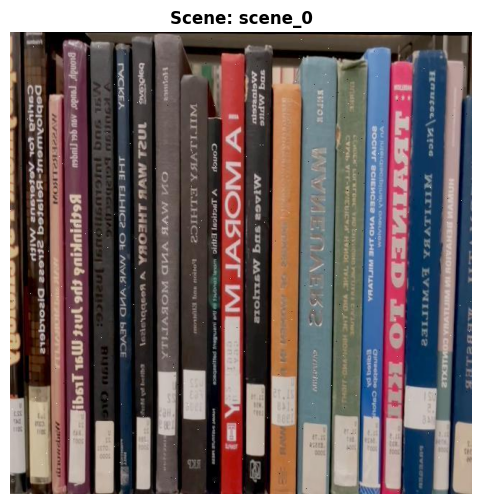

No books detected.


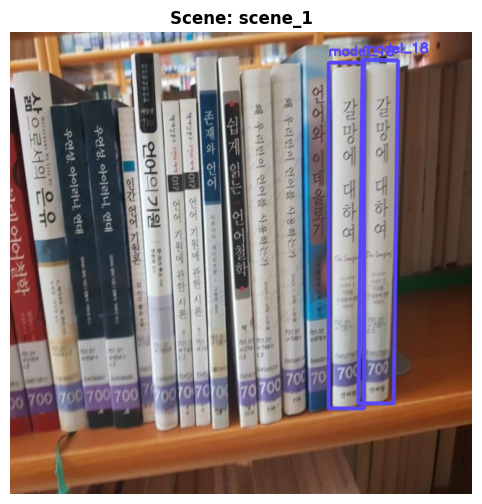

model_18 - 2 instance(s) found:
    Instance 1 {top_left: (np.int64(441), np.int64(42)), top_right: (np.int64(490), np.int64(42)), bottom_left: (np.int64(441), np.int64(521)), bottom_right: (np.int64(490), np.int64(521)), area: 23471px}
    Instance 2 {top_left: (np.int64(488), np.int64(38)), top_right: (np.int64(537), np.int64(39)), bottom_left: (np.int64(482), np.int64(514)), bottom_right: (np.int64(531), np.int64(514)), area: 23302px}


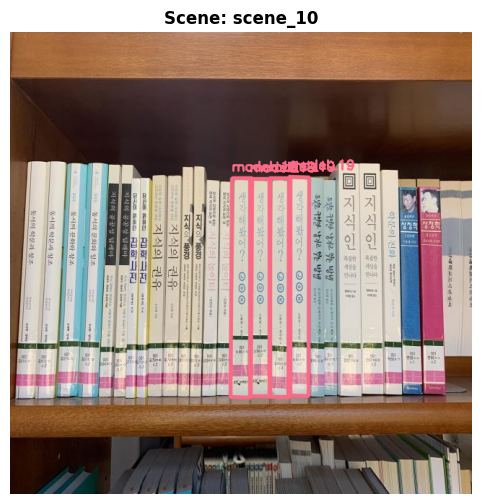

model_19 - 4 instance(s) found:
    Instance 1 {top_left: (np.int64(332), np.int64(203)), top_right: (np.int64(360), np.int64(203)), bottom_left: (np.int64(332), np.int64(504)), bottom_right: (np.int64(360), np.int64(504)), area: 8428px}
    Instance 2 {top_left: (np.int64(307), np.int64(202)), top_right: (np.int64(335), np.int64(202)), bottom_left: (np.int64(305), np.int64(505)), bottom_right: (np.int64(333), np.int64(506)), area: 8499px}
    Instance 3 {top_left: (np.int64(359), np.int64(202)), top_right: (np.int64(388), np.int64(202)), bottom_left: (np.int64(359), np.int64(505)), bottom_right: (np.int64(388), np.int64(505)), area: 8787px}
    Instance 4 {top_left: (np.int64(386), np.int64(200)), top_right: (np.int64(414), np.int64(201)), bottom_left: (np.int64(385), np.int64(503)), bottom_right: (np.int64(413), np.int64(504)), area: 8485px}


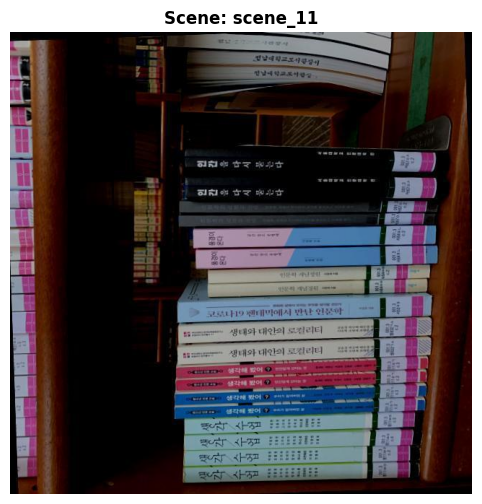

No books detected.


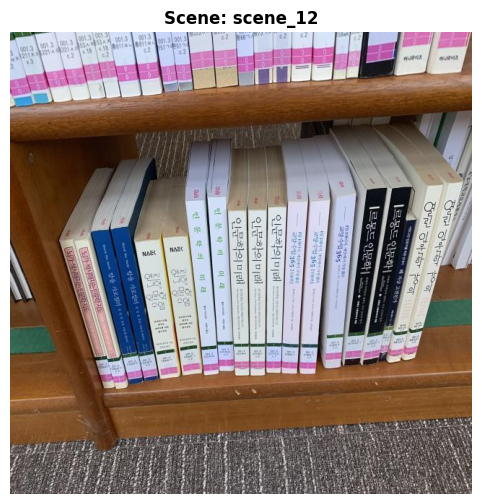

No books detected.


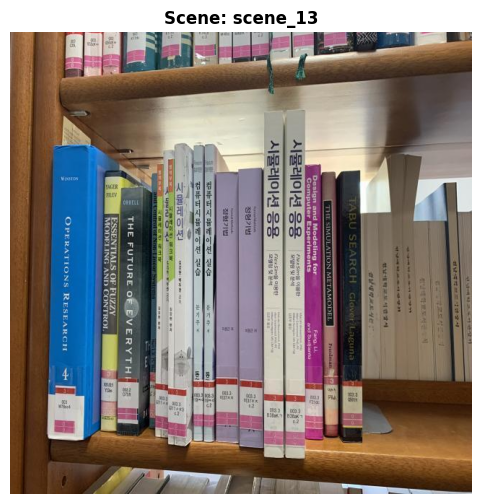

No books detected.


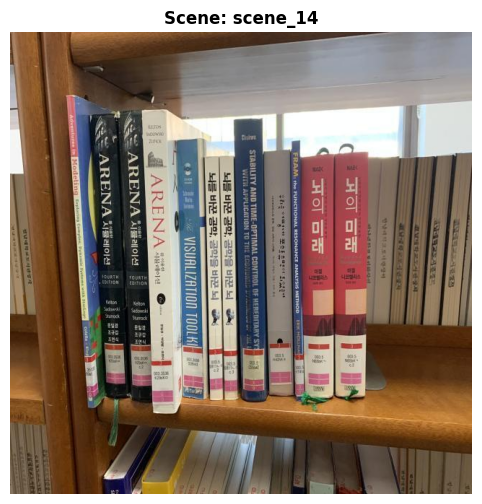

No books detected.


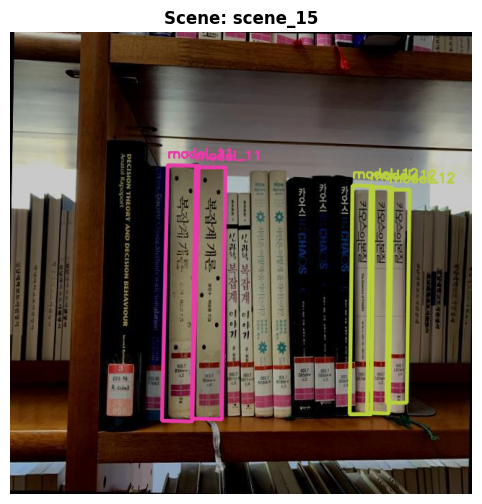

model_11 - 2 instance(s) found:
    Instance 1 {top_left: (np.int64(257), np.int64(187)), top_right: (np.int64(298), np.int64(187)), bottom_left: (np.int64(251), np.int64(535)), bottom_right: (np.int64(293), np.int64(536)), area: 14465px}
    Instance 2 {top_left: (np.int64(218), np.int64(184)), top_right: (np.int64(261), np.int64(185)), bottom_left: (np.int64(210), np.int64(538)), bottom_right: (np.int64(252), np.int64(539)), area: 15053px}
model_12 - 3 instance(s) found:
    Instance 1 {top_left: (np.int64(499), np.int64(214)), top_right: (np.int64(529), np.int64(215)), bottom_left: (np.int64(494), np.int64(527)), bottom_right: (np.int64(524), np.int64(528)), area: 9395px}
    Instance 2 {top_left: (np.int64(474), np.int64(212)), top_right: (np.int64(503), np.int64(213)), bottom_left: (np.int64(470), np.int64(529)), bottom_right: (np.int64(500), np.int64(529)), area: 9338px}
    Instance 3 {top_left: (np.int64(525), np.int64(218)), top_right: (np.int64(553), np.int64(218)), bottom_le

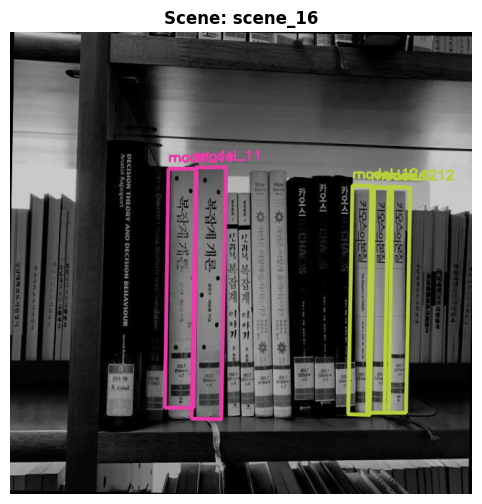

model_11 - 2 instance(s) found:
    Instance 1 {top_left: (np.int64(257), np.int64(187)), top_right: (np.int64(299), np.int64(187)), bottom_left: (np.int64(251), np.int64(535)), bottom_right: (np.int64(292), np.int64(536)), area: 14466px}
    Instance 2 {top_left: (np.int64(219), np.int64(189)), top_right: (np.int64(258), np.int64(189)), bottom_left: (np.int64(214), np.int64(520)), bottom_right: (np.int64(254), np.int64(520)), area: 13074px}
model_12 - 3 instance(s) found:
    Instance 1 {top_left: (np.int64(500), np.int64(214)), top_right: (np.int64(529), np.int64(215)), bottom_left: (np.int64(494), np.int64(527)), bottom_right: (np.int64(524), np.int64(527)), area: 9221px}
    Instance 2 {top_left: (np.int64(474), np.int64(212)), top_right: (np.int64(504), np.int64(213)), bottom_left: (np.int64(468), np.int64(529)), bottom_right: (np.int64(498), np.int64(530)), area: 9516px}
    Instance 3 {top_left: (np.int64(524), np.int64(214)), top_right: (np.int64(554), np.int64(215)), bottom_le

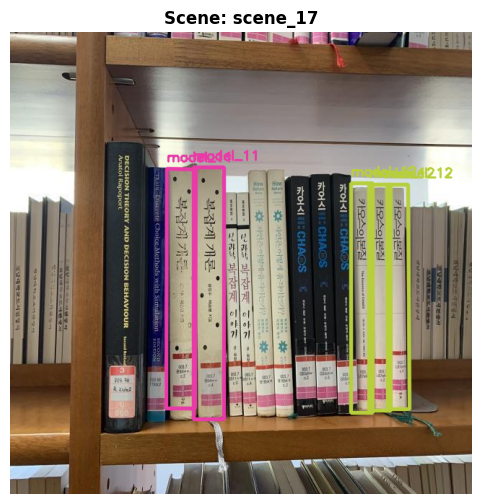

model_11 - 2 instance(s) found:
    Instance 1 {top_left: (np.int64(254), np.int64(187)), top_right: (np.int64(296), np.int64(187)), bottom_left: (np.int64(254), np.int64(536)), bottom_right: (np.int64(296), np.int64(536)), area: 14658px}
    Instance 2 {top_left: (np.int64(217), np.int64(189)), top_right: (np.int64(257), np.int64(190)), bottom_left: (np.int64(216), np.int64(521)), bottom_right: (np.int64(256), np.int64(521)), area: 13260px}
model_12 - 3 instance(s) found:
    Instance 1 {top_left: (np.int64(497), np.int64(211)), top_right: (np.int64(527), np.int64(211)), bottom_left: (np.int64(497), np.int64(524)), bottom_right: (np.int64(527), np.int64(524)), area: 9390px}
    Instance 2 {top_left: (np.int64(472), np.int64(209)), top_right: (np.int64(502), np.int64(209)), bottom_left: (np.int64(472), np.int64(527)), bottom_right: (np.int64(502), np.int64(527)), area: 9540px}
    Instance 3 {top_left: (np.int64(522), np.int64(211)), top_right: (np.int64(551), np.int64(211)), bottom_le

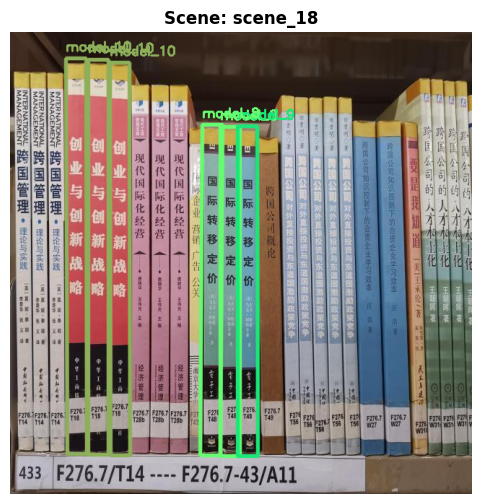

model_10 - 3 instance(s) found:
    Instance 1 {top_left: (np.int64(108), np.int64(38)), top_right: (np.int64(136), np.int64(38)), bottom_left: (np.int64(108), np.int64(585)), bottom_right: (np.int64(136), np.int64(585)), area: 15316px}
    Instance 2 {top_left: (np.int64(77), np.int64(36)), top_right: (np.int64(105), np.int64(36)), bottom_left: (np.int64(79), np.int64(584)), bottom_right: (np.int64(106), np.int64(584)), area: 15070px}
    Instance 3 {top_left: (np.int64(138), np.int64(42)), top_right: (np.int64(165), np.int64(42)), bottom_left: (np.int64(139), np.int64(586)), bottom_right: (np.int64(166), np.int64(586)), area: 14688px}
model_8 - 2 instance(s) found:
    Instance 1 {top_left: (np.int64(291), np.int64(131)), top_right: (np.int64(318), np.int64(131)), bottom_left: (np.int64(291), np.int64(587)), bottom_right: (np.int64(318), np.int64(587)), area: 12312px}
    Instance 2 {top_left: (np.int64(266), np.int64(128)), top_right: (np.int64(294), np.int64(128)), bottom_left: (np

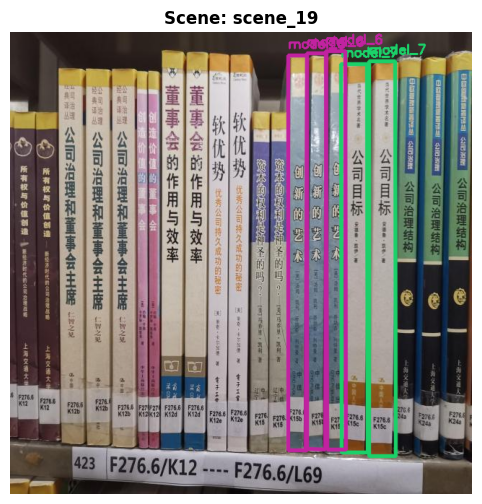

model_6 - 3 instance(s) found:
    Instance 1 {top_left: (np.int64(385), np.int64(32)), top_right: (np.int64(411), np.int64(32)), bottom_left: (np.int64(385), np.int64(579)), bottom_right: (np.int64(411), np.int64(579)), area: 14222px}
    Instance 2 {top_left: (np.int64(411), np.int64(29)), top_right: (np.int64(438), np.int64(29)), bottom_left: (np.int64(409), np.int64(577)), bottom_right: (np.int64(436), np.int64(578)), area: 14810px}
    Instance 3 {top_left: (np.int64(437), np.int64(26)), top_right: (np.int64(464), np.int64(26)), bottom_left: (np.int64(439), np.int64(578)), bottom_right: (np.int64(465), np.int64(578)), area: 14628px}
model_7 - 2 instance(s) found:
    Instance 1 {top_left: (np.int64(497), np.int64(40)), top_right: (np.int64(533), np.int64(40)), bottom_left: (np.int64(497), np.int64(587)), bottom_right: (np.int64(534), np.int64(587)), area: 19965px}
    Instance 2 {top_left: (np.int64(458), np.int64(44)), top_right: (np.int64(494), np.int64(44)), bottom_left: (np.in

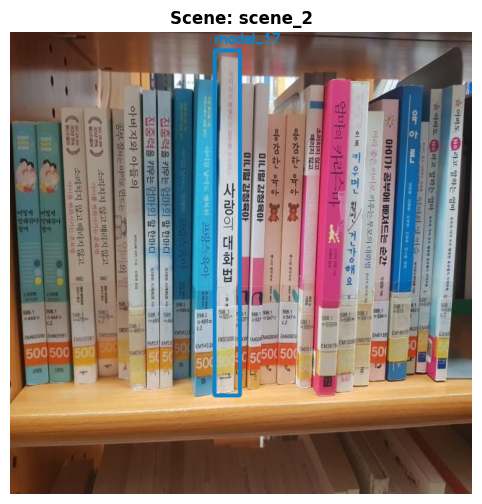

model_17 - 1 instance(s) found:
    Instance 1 {top_left: (np.int64(283), np.int64(25)), top_right: (np.int64(318), np.int64(25)), bottom_left: (np.int64(283), np.int64(503)), bottom_right: (np.int64(318), np.int64(503)), area: 16730px}


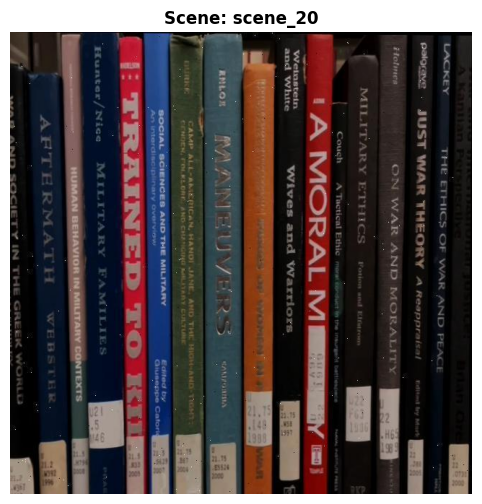

No books detected.


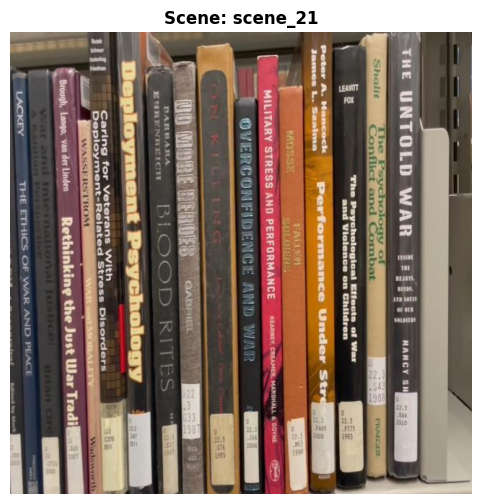

No books detected.


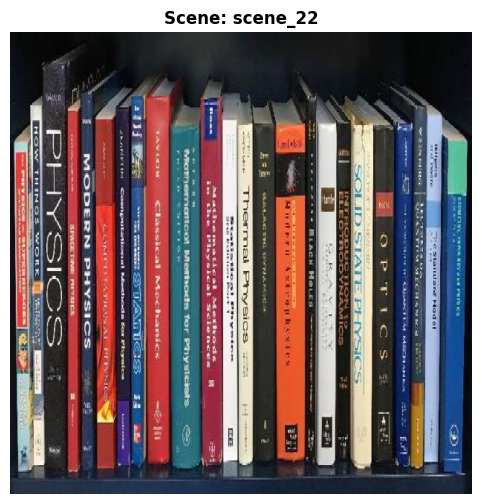

No books detected.


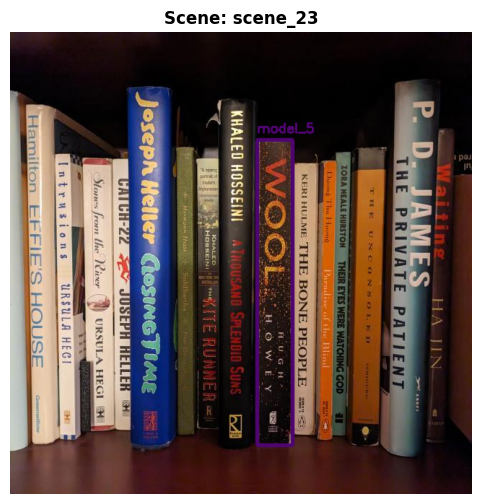

model_5 - 1 instance(s) found:
    Instance 1 {top_left: (np.int64(342), np.int64(149)), top_right: (np.int64(391), np.int64(149)), bottom_left: (np.int64(342), np.int64(572)), bottom_right: (np.int64(391), np.int64(572)), area: 20727px}


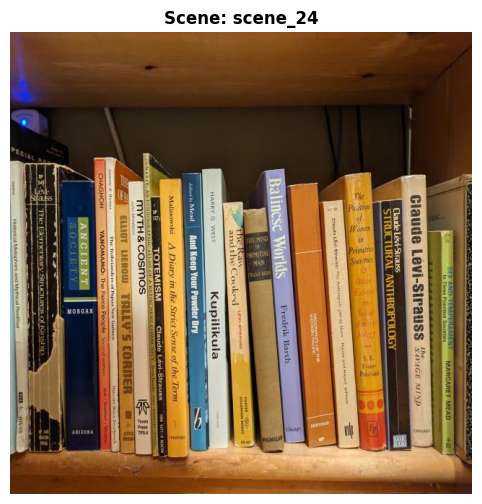

No books detected.


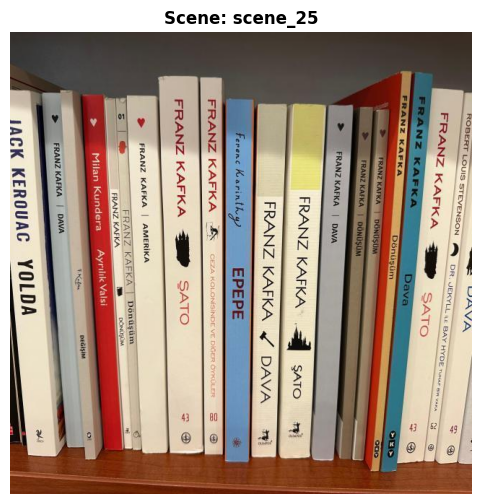

No books detected.


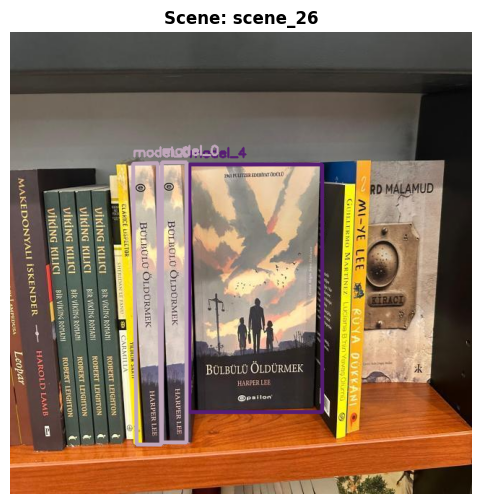

model_0 - 2 instance(s) found:
    Instance 1 {top_left: (np.int64(210), np.int64(180)), top_right: (np.int64(244), np.int64(180)), bottom_left: (np.int64(210), np.int64(568)), bottom_right: (np.int64(244), np.int64(568)), area: 13192px}
    Instance 2 {top_left: (np.int64(170), np.int64(182)), top_right: (np.int64(204), np.int64(181)), bottom_left: (np.int64(175), np.int64(571)), bottom_right: (np.int64(209), np.int64(571)), area: 13245px}
model_4 - 1 instance(s) found:
    Instance 1 {top_left: (np.int64(248), np.int64(183)), top_right: (np.int64(432), np.int64(183)), bottom_left: (np.int64(248), np.int64(526)), bottom_right: (np.int64(432), np.int64(526)), area: 63112px}


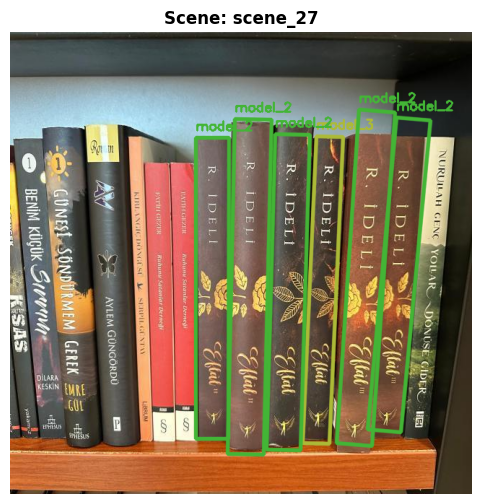

model_2 - 5 instance(s) found:
    Instance 1 {top_left: (np.int64(257), np.int64(146)), top_right: (np.int64(303), np.int64(146)), bottom_left: (np.int64(257), np.int64(563)), bottom_right: (np.int64(302), np.int64(563)), area: 18973px}
    Instance 2 {top_left: (np.int64(311), np.int64(120)), top_right: (np.int64(362), np.int64(121)), bottom_left: (np.int64(301), np.int64(584)), bottom_right: (np.int64(351), np.int64(585)), area: 23442px}
    Instance 3 {top_left: (np.int64(535), np.int64(118)), top_right: (np.int64(582), np.int64(122)), bottom_left: (np.int64(495), np.int64(550)), bottom_right: (np.int64(541), np.int64(554)), area: 20250px}
    Instance 4 {top_left: (np.int64(367), np.int64(141)), top_right: (np.int64(415), np.int64(142)), bottom_left: (np.int64(355), np.int64(578)), bottom_right: (np.int64(402), np.int64(579)), area: 20770px}
    Instance 5 {top_left: (np.int64(483), np.int64(107)), top_right: (np.int64(533), np.int64(111)), bottom_left: (np.int64(452), np.int64(56

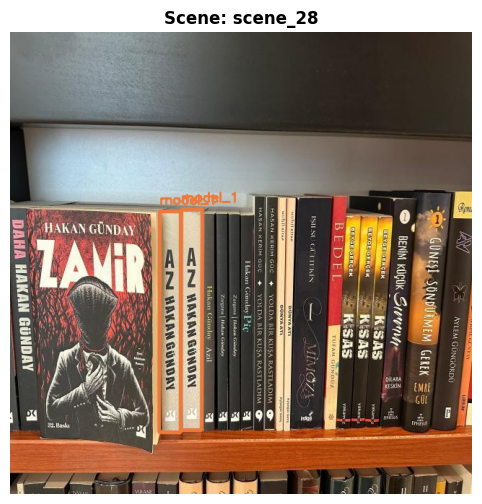

model_1 - 2 instance(s) found:
    Instance 1 {top_left: (np.int64(207), np.int64(248)), top_right: (np.int64(236), np.int64(248)), bottom_left: (np.int64(206), np.int64(554)), bottom_right: (np.int64(236), np.int64(554)), area: 9027px}
    Instance 2 {top_left: (np.int64(237), np.int64(245)), top_right: (np.int64(266), np.int64(245)), bottom_left: (np.int64(236), np.int64(551)), bottom_right: (np.int64(265), np.int64(551)), area: 8874px}


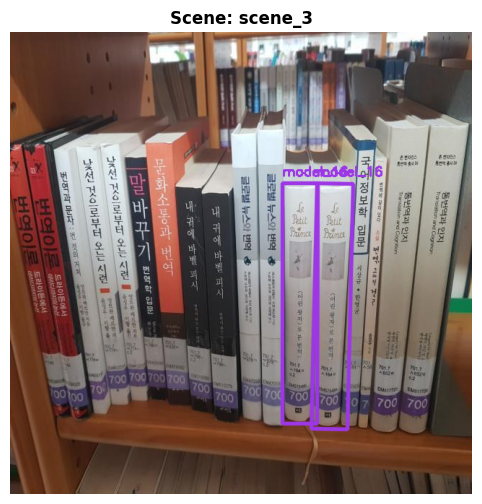

model_16 - 2 instance(s) found:
    Instance 1 {top_left: (np.int64(377), np.int64(209)), top_right: (np.int64(426), np.int64(209)), bottom_left: (np.int64(377), np.int64(542)), bottom_right: (np.int64(425), np.int64(542)), area: 16150px}
    Instance 2 {top_left: (np.int64(425), np.int64(209)), top_right: (np.int64(475), np.int64(210)), bottom_left: (np.int64(417), np.int64(549)), bottom_right: (np.int64(467), np.int64(550)), area: 17008px}


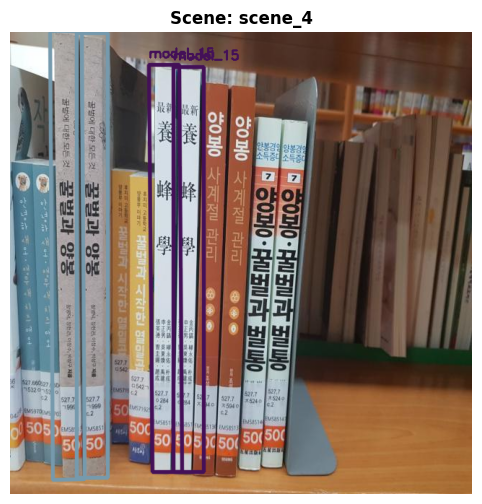

model_14 - 2 instance(s) found:
    Instance 1 {top_left: (np.int64(92), np.int64(1)), top_right: (np.int64(135), np.int64(1)), bottom_left: (np.int64(92), np.int64(617)), bottom_right: (np.int64(135), np.int64(617)), area: 26488px}
    Instance 2 {top_left: (np.int64(55), np.int64(-2)), top_right: (np.int64(99), np.int64(-2)), bottom_left: (np.int64(59), np.int64(620)), bottom_right: (np.int64(103), np.int64(619)), area: 27348px}
model_15 - 2 instance(s) found:
    Instance 1 {top_left: (np.int64(226), np.int64(48)), top_right: (np.int64(268), np.int64(48)), bottom_left: (np.int64(226), np.int64(609)), bottom_right: (np.int64(268), np.int64(609)), area: 23562px}
    Instance 2 {top_left: (np.int64(192), np.int64(45)), top_right: (np.int64(234), np.int64(45)), bottom_left: (np.int64(197), np.int64(609)), bottom_right: (np.int64(238), np.int64(609)), area: 23406px}


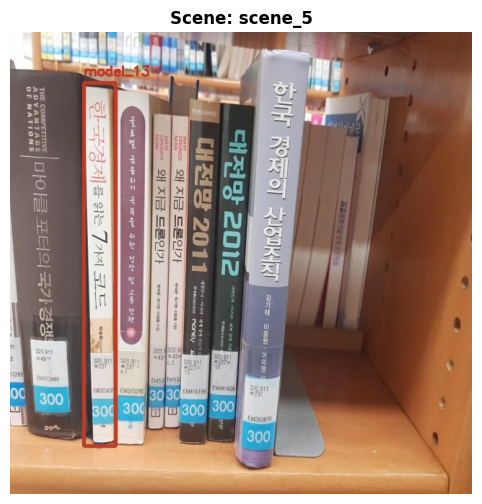

model_13 - 1 instance(s) found:
    Instance 1 {top_left: (np.int64(102), np.int64(70)), top_right: (np.int64(146), np.int64(70)), bottom_left: (np.int64(102), np.int64(573)), bottom_right: (np.int64(146), np.int64(573)), area: 22132px}


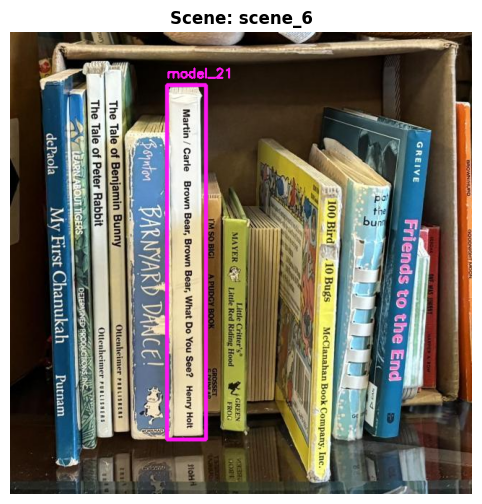

model_21 - 1 instance(s) found:
    Instance 1 {top_left: (np.int64(217), np.int64(73)), top_right: (np.int64(271), np.int64(73)), bottom_left: (np.int64(217), np.int64(564)), bottom_right: (np.int64(271), np.int64(564)), area: 26514px}


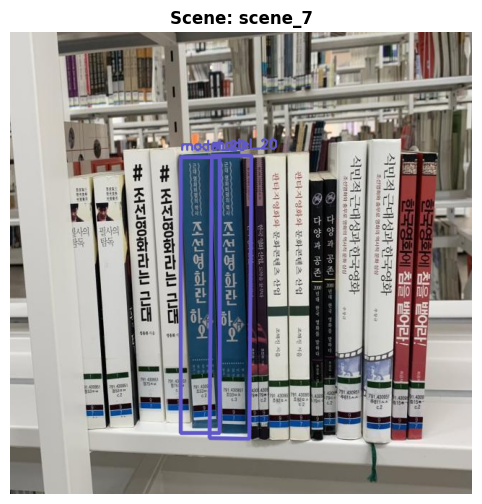

model_20 - 2 instance(s) found:
    Instance 1 {top_left: (np.int64(236), np.int64(173)), top_right: (np.int64(290), np.int64(173)), bottom_left: (np.int64(236), np.int64(555)), bottom_right: (np.int64(290), np.int64(555)), area: 20628px}
    Instance 2 {top_left: (np.int64(279), np.int64(171)), top_right: (np.int64(334), np.int64(171)), bottom_left: (np.int64(276), np.int64(562)), bottom_right: (np.int64(331), np.int64(563)), area: 21534px}


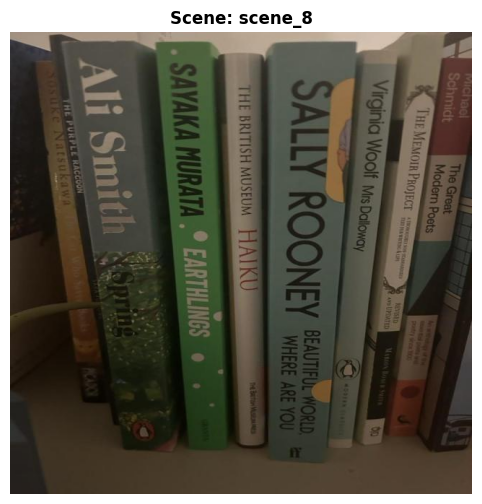

No books detected.


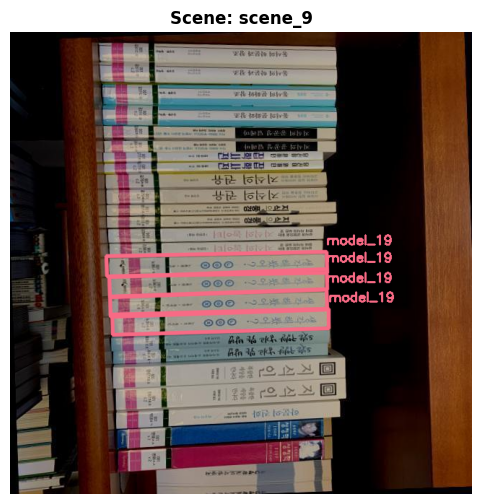

model_19 - 4 instance(s) found:
    Instance 1 {top_left: (np.int64(438), np.int64(328)), top_right: (np.int64(439), np.int64(356)), bottom_left: (np.int64(137), np.int64(339)), bottom_right: (np.int64(138), np.int64(367)), area: 8439px}
    Instance 2 {top_left: (np.int64(438), np.int64(356)), top_right: (np.int64(439), np.int64(384)), bottom_left: (np.int64(138), np.int64(366)), bottom_right: (np.int64(139), np.int64(394)), area: 8410px}
    Instance 3 {top_left: (np.int64(441), np.int64(383)), top_right: (np.int64(441), np.int64(410)), bottom_left: (np.int64(141), np.int64(391)), bottom_right: (np.int64(142), np.int64(419)), area: 8240px}
    Instance 4 {top_left: (np.int64(438), np.int64(304)), top_right: (np.int64(439), np.int64(333)), bottom_left: (np.int64(133), np.int64(310)), bottom_right: (np.int64(134), np.int64(338)), area: 8698px}


In [39]:
vis = Visualizer()
vis.show_results(all_results, SCENES_DIR)